# Beta Band Activity During Gait

This notebook runs through the pipeline of analyzing EEG beta activity during walking. The dataset was downloaded from OpenNeuro, "Noelle A. Jacobsen and Daniel P. Ferris (2023). Mobile EEG split-belt walking study. OpenNeuro. [Dataset] doi: doi:10.18112/openneuro.ds004475.v1.0.3"

Here we will:

- Load the dataset  
- Understand what is inside the raw EEG file  
- Preprocess the data
        - Filtering
        - Rereferencing
        - Removing line noise
- Epoch around gait events 
- Artifact rejection using "AutoReject"
- Run ICA to clean artifacts  
 
- Compute beta-band power (ERSP)  

## Load imports


In [3]:
import os
import numpy as np
from utils.config import dir_data
import mne
import pandas as pd
import matplotlib.pyplot as plt
# from meegkit.asr import ASR
# from meegkit.utils.matrix import sliding_window
from mne.preprocessing import ICA
from mne_bids import BIDSPath, read_raw_bids, print_dir_tree
from mne_icalabel import label_components
from mne.time_frequency import tfr_morlet
from autoreject import AutoReject

## Directory sanity check

In [4]:
print("Current Working Directory:", os.getcwd())

Current Working Directory: c:\Vaishali\NG\Multiversebeta\betaGaitMultiverse


## Load BIDS dataset

In [5]:
data_root = dir_data/'ds004475'
subject_label = 'S18'

print_dir_tree(data_root, max_depth=3)

bids_path = BIDSPath(
    subject=subject_label,
    task='task',
    root=data_root,
    datatype='eeg'
)

raw = read_raw_bids(bids_path=bids_path)
raw

|ds004475\
|--- .bidsignore
|--- CHANGES
|--- README
|--- dataset_description.json
|--- participants.json
|--- participants.tsv
|--- task-task_events.json
|--- sourcedata\
|------ data_dictionary.xlsx
|--- sub-S18\
|------ anat\
|------ eeg\
|--------- sub-S18_task-task_channels.tsv
|--------- sub-S18_task-task_coordsystem.json
|--------- sub-S18_task-task_eeg.fdt
|--------- sub-S18_task-task_eeg.json
|--------- sub-S18_task-task_eeg.set
|--------- sub-S18_task-task_electrodes.tsv
|--------- sub-S18_task-task_events.tsv
|------ headmodel\
|--------- sub-S18_elec_aligned.mat
|--------- sub-S18_headmodel_fem_tr.mat
|--------- sub-S18_leadfield.mat
|--- sub-S19\
|------ anat\
|------ eeg\
|--------- sub-S19_task-task_channels.tsv
|--------- sub-S19_task-task_coordsystem.json
|--------- sub-S19_task-task_eeg.fdt
|--------- sub-S19_task-task_eeg.json
|--------- sub-S19_task-task_eeg.set
|--------- sub-S19_task-task_electrodes.tsv
|--------- sub-S19_task-task_events.tsv
|------ headmodel\
|-

C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\2336472402.py:13: RuntimeWarning: Unknown types found, setting as type EEG:
fz: ['Fz1', 'Fz2']
noise: ['2-A1', '2-A10', '2-A11', '2-A12', '2-A13', '2-A14', '2-A15', '2-A16', '2-A17', '2-A18', '2-A19', '2-A2', '2-A20', '2-A21', '2-A22', '2-A23', '2-A24', '2-A26', '2-A27', '2-A28', '2-A29', '2-A3', '2-A30', '2-A31', '2-A32', '2-A4', '2-A5', '2-A6', '2-A7', '2-A8', '2-A9', '2-B1', '2-B10', '2-B11', '2-B12', '2-B13', '2-B14', '2-B15', '2-B16', '2-B17', '2-B18', '2-B19', '2-B2', '2-B20', '2-B21', '2-B22', '2-B23', '2-B24', '2-B25', '2-B26', '2-B27', '2-B28', '2-B29', '2-B3', '2-B30', '2-B31', '2-B32', '2-B4', '2-B5', '2-B6', '2-B7', '2-B8', '2-B9', '2-C1', '2-C10', '2-C11', '2-C12', '2-C13', '2-C14', '2-C15', '2-C16', '2-C17', '2-C18', '2-C19', '2-C2', '2-C20', '2-C21', '2-C22', '2-C23', '2-C24', '2-C25', '2-C26', '2-C27', '2-C28', '2-C29', '2-C3', '2-C30', '2-C31', '2-C32', '2-C4', '2-C5', '2-D1', '2-D10', '2-D11', '2-D12', '2-D13', '2-D

Reading events from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_events.tsv.


C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\2336472402.py:13: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = read_raw_bids(bids_path=bids_path)
C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\2336472402.py:13: RuntimeWarning: Not setting positions of 8 emg channels found in montage:
['1-EXG1', '1-EXG2', '1-EXG3', '1-EXG4', '1-EXG5', '1-EXG6', '1-EXG7', '1-EXG8']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path=bids_path)


Reading channel info from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_channels.tsv.
Reading electrode coords from C:\Vaishali\NG\Multiversebeta\betaGaitMultiverse\data\ds004475\sub-S18\eeg\sub-S18_task-task_electrodes.tsv.


C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\2336472402.py:13: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['1-EXG1', '1-EXG2', '1-EXG3', '1-EXG4', '1-EXG5', '1-EXG6', '1-EXG7', '1-EXG8', '2-A1', '2-A2', '2-A3', '2-A4', '2-A5', '2-A6', '2-A7', '2-A8', '2-A9', '2-A10', '2-A11', '2-A12', '2-A13', '2-A14', '2-A15', '2-A16', '2-A17', '2-A18', '2-A19', '2-A20', '2-A21', '2-A22', '2-A23', '2-A24', '2-A26', '2-A27', '2-A28', '2-A29', '2-A30', '2-A31', '2-A32', '2-B1', '2-B2', '2-B3', '2-B4', '2-B5', '2-B6', '2-B7', '2-B8', '2-B9', '2-B10', '2-B11', '2-B12', '2-B13', '2-B14', '2-B15', '2-B16', '2-B17', '2-B18', '2-B19', '2-B20', '2-B21', '2-B22', '2-B23', '2-B24', '2-B25', '2-B26', '2-B27', '2-B28', '2-B29', '2-B30', '2-B31', '2-B32', '2-C1', '2-C2', '2-C3', '2-C4', '2-C5', '2-C10', '2-C11', '2-C12', '2-C13', '2-C14', '2-C15', '2-C16', '2-C17', '2-C18', '2-C19', '2-C20', '2-C21', '2-C22', '2-C23', '2-C24', '2-C25', '2-C26', '2-C27', '2-C28', '

<RawEEGLAB | sub-S18_task-task_eeg.fdt, 255 x 1657344 (3237.0 s), ~239 KiB, data not loaded>

## Channel information


In [6]:
# Identify noise layer channels
noise_chs = [ch for ch in raw.ch_names if ch.startswith("2-")]
emg_chs = [ch for ch in raw.ch_names if ch.startswith("1-EXG")]

raw.drop_channels(noise_chs + emg_chs)

# Keep only EEG channels
raw_eeg = raw.pick_types(eeg=True)

print(f"Remaining channels: {len(raw.ch_names)}")

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Remaining channels: 122


4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


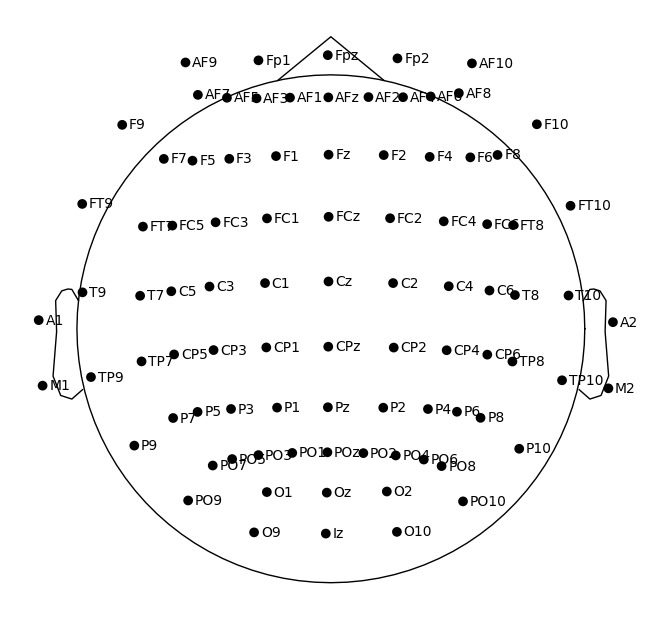

In [7]:
# Display montage
m = mne.channels.make_standard_montage('standard_1020')
m.plot(show_names=True);

## Preprocessing
### Filtering
Applying a high-pass filter of 1 Hz, 2nd order Butterworth

In [8]:
# raw = read_raw_bids(bids_path=bids_path)
raw_eeg.load_data()

raw_eeg.filter(
    l_freq=1.0,
    h_freq=None,
    method="iir",
    iir_params=dict(order=2, ftype='butter'),
    phase='zero'
)

Reading 0 ... 1657343  =      0.000 ...  3236.998 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

IIR filter parameters
---------------------
Butterworth highpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 4 (effective, after forward-backward)
- Cutoff at 1.00 Hz: -6.02 dB



<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

### Re-Reference

In [9]:
raw_eeg.set_eeg_reference("average", projection=False)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

### Remove Line Noise

In [10]:
raw_eeg.notch_filter(freqs=50)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



<RawEEGLAB | sub-S18_task-task_eeg.fdt, 122 x 1657344 (3237.0 s), ~1.51 GiB, data loaded>

## Cropping dataset
The dataset consists of a 40-minute recording":

    0–15 min → pre-adaptation
    15–30 min → split-belt adaptation
    30–40 min → post-adaptation

We are only interested in the 15 min "adaptation" phase so let's crop only this part. The gait events are already in the dataset for each subject "sub-S18_task-task_events.tsv". The first step is the understand what the file consists of.


In [11]:
events_path = os.path.join(
    dir_data,
    "ds004475",
    "sub-S18",
    "eeg",
    "sub-S18_task-task_events.tsv"
)

events_df = pd.read_csv(events_path, sep="\t", header=None)
events_df.columns = ["onset", "duration", "sample", "trial_type"]
events_df = events_df[events_df['onset'] != 'onset']  # remove the header row
events_df['onset'] = events_df['onset'].astype(float)
events_df['duration'] = events_df['duration'].astype(float)
events_df['sample'] = events_df['sample'].astype(float)

print(events_df["trial_type"].unique())

<StringArray>
[ '9633791',      'RHS',      'LHS',      'RTO',      'LTO',     'TRIG',
       'B1',   'BUTTON',       'B2',   'End B1',       'B3',   'End B2',
      'SB1',   'End B3',       'P1',  'End SB1',   'End P1', 'boundary',
      'SB2',       'P2',  'End SB2',   'End P2']
Length: 22, dtype: str


In [12]:
seg = events_df[events_df["trial_type"].isin(["B1","B2","B3",
                                                 "End B1","End B2","End B3"])]

seg = seg[["onset","trial_type"]]
seg["onset"] = seg["onset"].astype(float)

print(seg.sort_values("onset"))


           onset trial_type
15     27.773438         B1
978   332.732422         B2
979   332.732422     End B1
2238  633.085938         B3
2239  633.085938     End B2
3277  932.296875     End B3


## Isolate adaptation segment
From the output, B2 seems to be the split-belt adaptation segment we are interested in.

In [13]:
seg_start_row = events_df[events_df['trial_type'] == "B2"]
seg_end_row   = events_df[events_df['trial_type'] == "End B2"]

if seg_start_row.empty or seg_end_row.empty:
    raise ValueError("B2 markers not found. Check trial_type labels.")

seg_start_time = float(seg_start_row['onset'].values[0])
seg_end_time   = float(seg_end_row['onset'].values[0])

print(f'\nAdaptation segment ({"B2"} → {"End B2"}):')
print(f'  Start: {seg_start_time:.2f} s  (sample {seg_start_row["sample"]})')
print(f'  End:   {seg_end_time:.2f} s  (sample {seg_end_row["sample"]})')
print(f'  Duration: {seg_end_time - seg_start_time:.1f} s  ({(seg_end_time - seg_start_time)/60:.1f} min)')



Adaptation segment (B2 → End B2):
  Start: 332.73 s  (sample 978    170359.0
Name: sample, dtype: float64)
  End:   633.09 s  (sample 2239    324140.0
Name: sample, dtype: float64)
  Duration: 300.4 s  (5.0 min)


In [14]:
# Add buffer around the segment
BUFFER = 5.0  # seconds

crop_start = max(0, seg_start_time - BUFFER)
crop_end   = min(raw.times[-1], seg_end_time + BUFFER)

raw_seg = raw.copy().crop(tmin=crop_start, tmax=crop_end)
print(f'Cropped to {crop_start:.1f}–{crop_end:.1f} s  (duration: {raw_seg.times[-1]:.1f} s)')
print(f'This corresponds to the adaptation segment: {seg_start_time} → {seg_end_time}')


Cropped to 327.7–638.1 s  (duration: 310.4 s)
This corresponds to the adaptation segment: 332.732421875 → 633.0859375


## Epoching gait events
Considering our gait cycle from RHS -> RHS, let's create epochs based on the event labels

In [15]:
heel_strikes = events_df[
    (events_df['trial_type'].isin(['RHS'])) &
    (events_df['onset'] >= seg_start_time) &
    (events_df['onset'] <= seg_end_time)
].reset_index(drop=True)

heel_strikes = heel_strikes.sort_values('onset')
rhs_times = heel_strikes[heel_strikes['trial_type'] == 'RHS']['onset'].astype(float).values

# Define strides
strides = [(rhs_times[i], rhs_times[i+1]) for i in range(len(rhs_times)-1)]

# Create stride-by-stride epochs
stride_epochs = []
for start, end in strides:
    epoch = raw_seg.copy().crop(tmin=start - seg_start_time, tmax=end - seg_start_time)
    stride_epochs.append(epoch)

print(f"Total stride epochs: {len(stride_epochs)}")

Total stride epochs: 271


In [16]:
sfreq = raw.info['sfreq']

# Filter RHS events to adaptation segment
rhs_times = heel_strikes['onset'].values 

# Convert to samples in the cropped raw
rhs_samples = np.round((rhs_times - seg_start_time) * sfreq).astype(int)

# Build MNE events array: [sample, prev_id, event_id]
event_id = {'RHS': 1}
events_arr = np.column_stack([
    rhs_samples,
    np.zeros(len(rhs_samples), dtype=int),
    np.ones(len(rhs_samples), dtype=int)
])

# Epoch window 
tmin = -0.5   # s before RHS
tmax =  2.5   # s after  RHS

# Remove any events that fall outside the valid range
n_times = len(raw.times)
valid_mask = (
    (rhs_samples >= int(-tmin * sfreq)) &
    (rhs_samples <  int(n_times - tmax * sfreq))
)
events_arr = events_arr[valid_mask]
rhs_times  = rhs_times[valid_mask]

print(f'Valid RHS events for epoching: {len(events_arr)}')

# Create epochs
epochs = mne.Epochs(
    raw,
    events=events_arr,
    event_id=event_id,
    tmin=tmin,
    tmax=tmax,
    baseline=None, 
    preload=True,
    reject=None,      
    verbose=False
)

print(f'Epochs created: {len(epochs)}')
print(f'Epoch shape:    {epochs.get_data().shape}  (epochs × channels × times)')

Valid RHS events for epoching: 272
Epochs created: 272
Epoch shape:    (272, 122, 1537)  (epochs × channels × times)


## Using Autoreject for automated artifact rejection

Running autoreject on ch_type=eeg


100%|██████████| Creating augmented epochs : 122/122 [00:22<00:00,    5.51it/s]
100%|██████████| Computing thresholds ... : 122/122 [05:14<00:00,    2.57s/it]

















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:07<00:00,    4.04it/s]

















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:11<00:00,    3.79it/s]






















100%|██████████| Fold : 10/10 [01:11<00:00,    7.12s/it]
















































































Estimated consensus=0.40 and n_interpolate=4



















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:12<00:00,    3.74it/s]

Dropped 12 epochs: 50, 51, 52, 216, 217, 218, 219, 220, 224, 225, 250, 251


Using matplotlib as 2D backend.


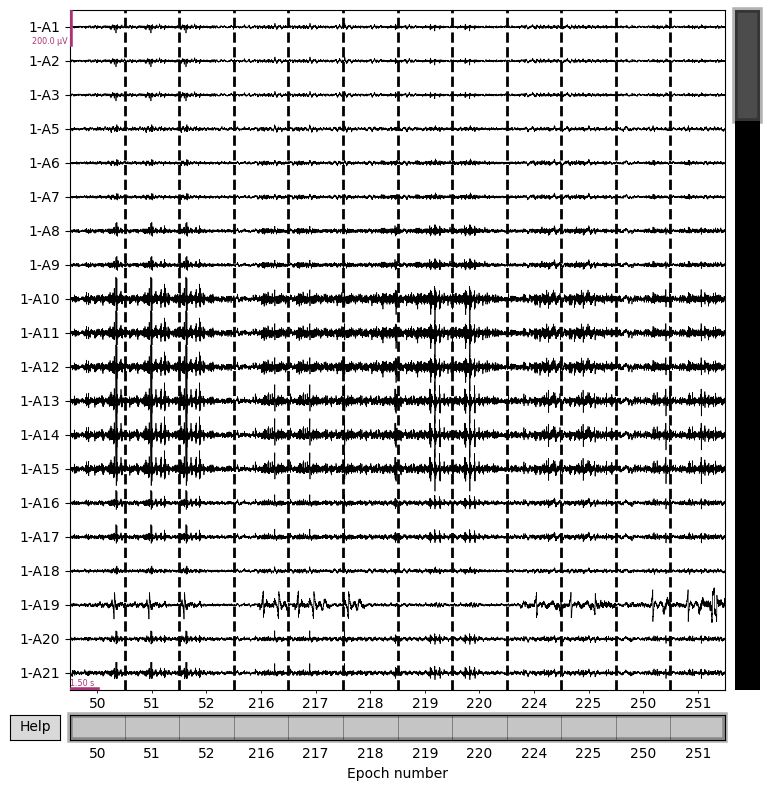

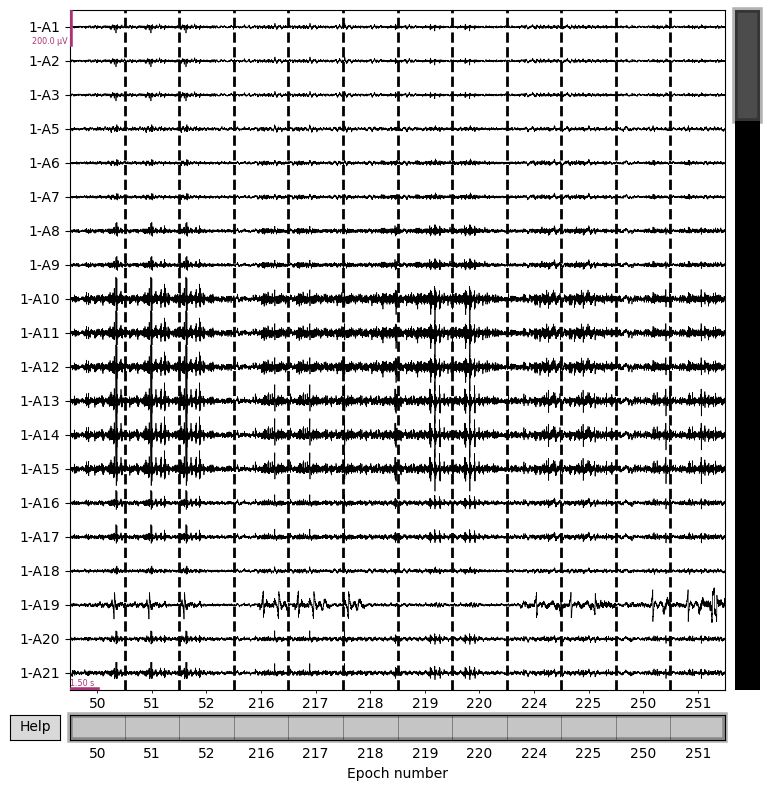

In [17]:
ar = AutoReject(
    n_interpolate=[1, 2, 3, 4],
    random_state=11,
    n_jobs=1,
    verbose=True
)
ar.fit(epochs)
epochs_ar, reject_log = ar.transform(epochs, return_log=True)
epochs[reject_log.bad_epochs].plot(scalings=dict(eeg=100e-6))

### Visualizing epoch quality

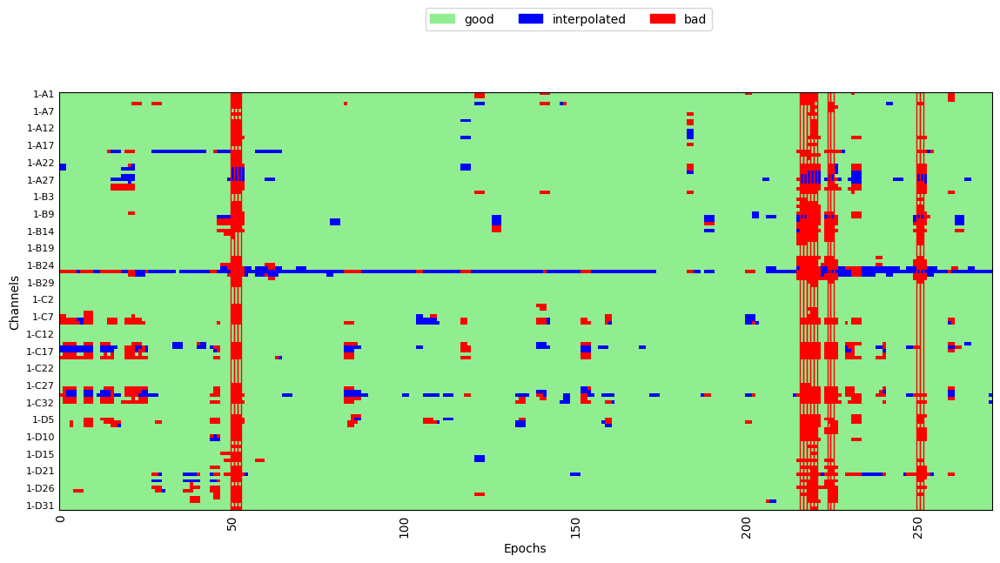

In [18]:
reject_log.plot('horizontal');

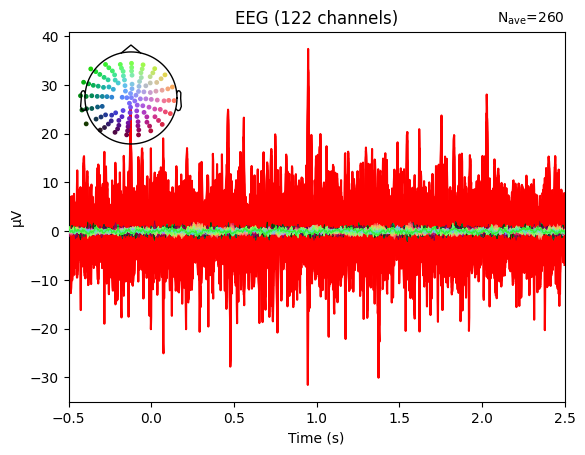

In [19]:
evoked_bad = epochs[reject_log.bad_epochs].average()
plt.figure()
plt.plot(evoked_bad.times, evoked_bad.data.T * 1e6, 'r', zorder=-1)
epochs_ar.average().plot(axes=plt.gca());

## ICA
Implementing ICA on cleaned epochs

In [20]:
ica = mne.preprocessing.ICA(random_state=99)
ica.fit(epochs_ar)


Fitting ICA to data using 122 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 122 components
Fitting ICA took 136.8s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,144 iterations on epochs (399620 samples)
ICA components,122
Available PCA components,122
Channel types,eeg
ICA components marked for exclusion,—


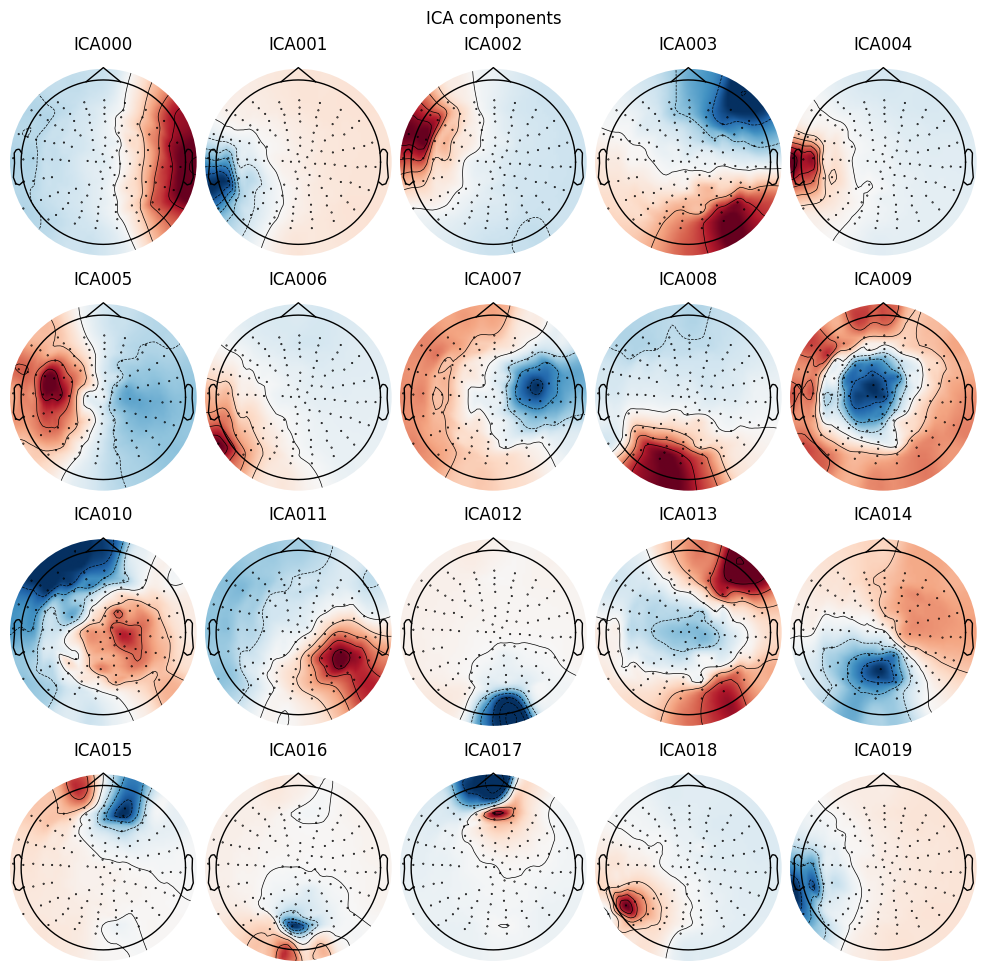

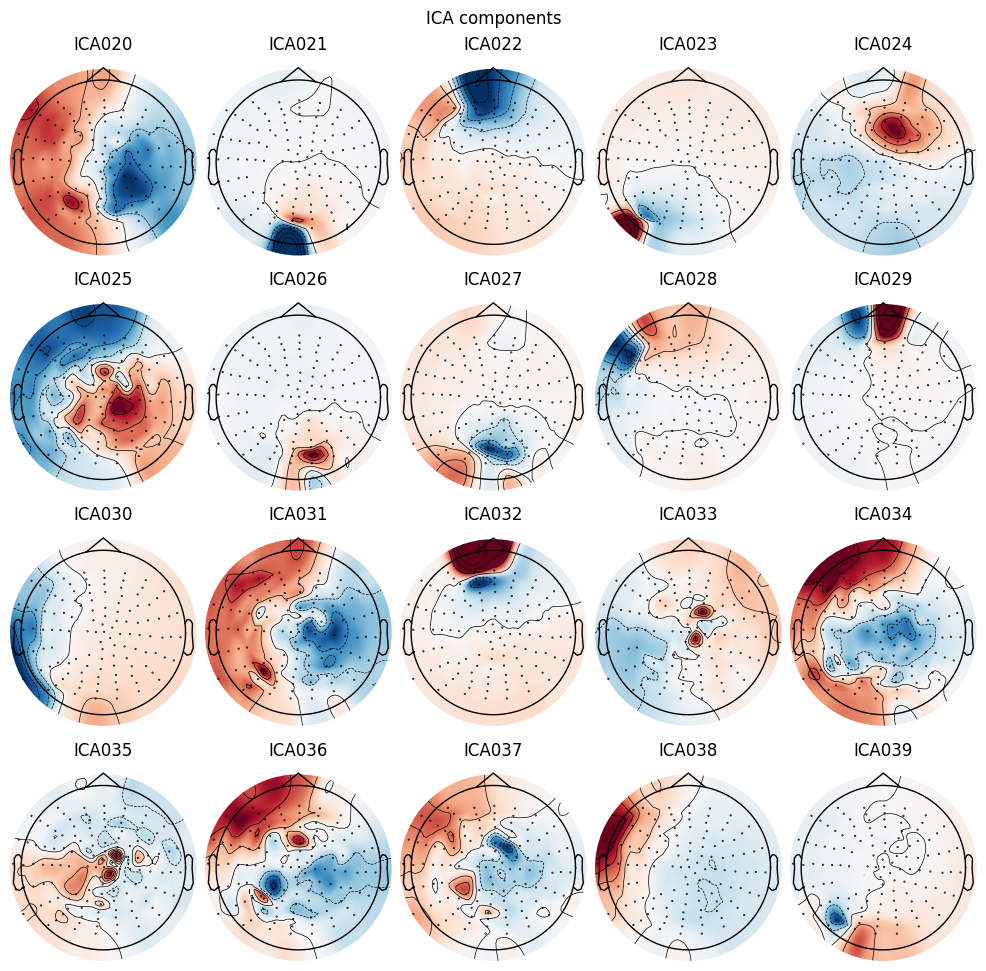

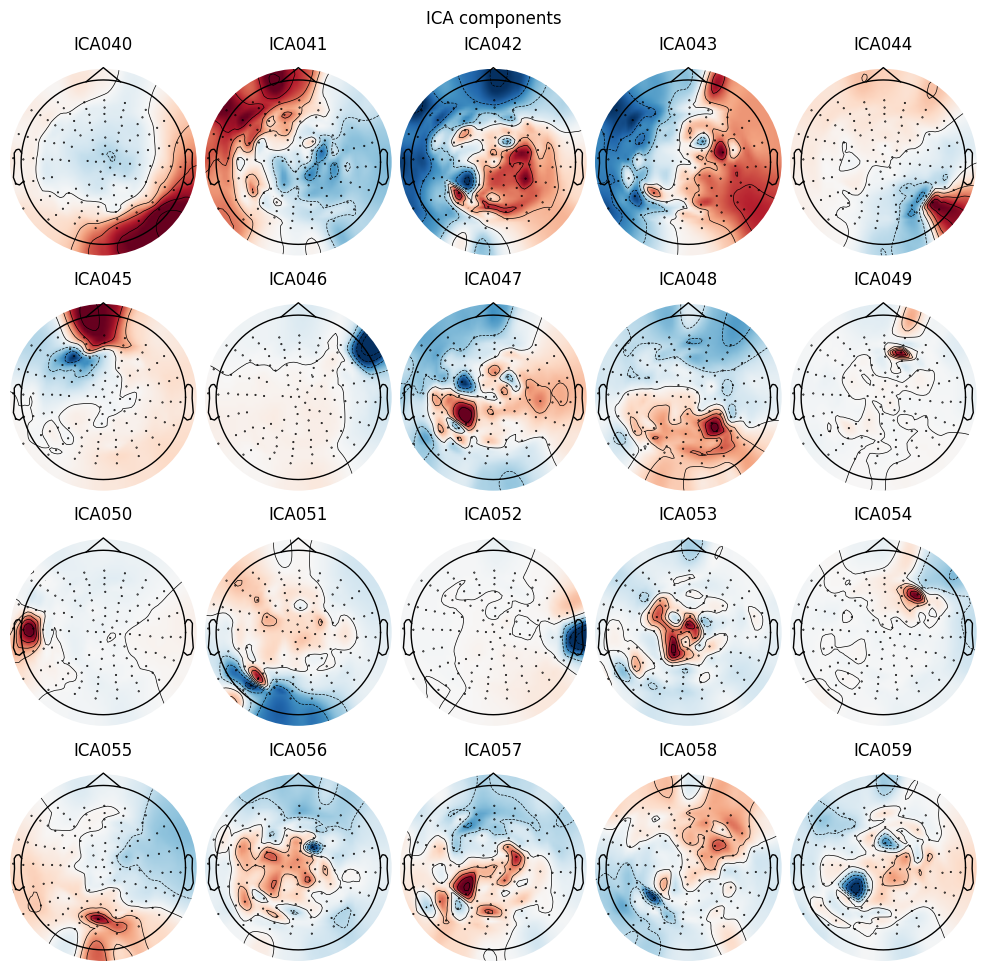

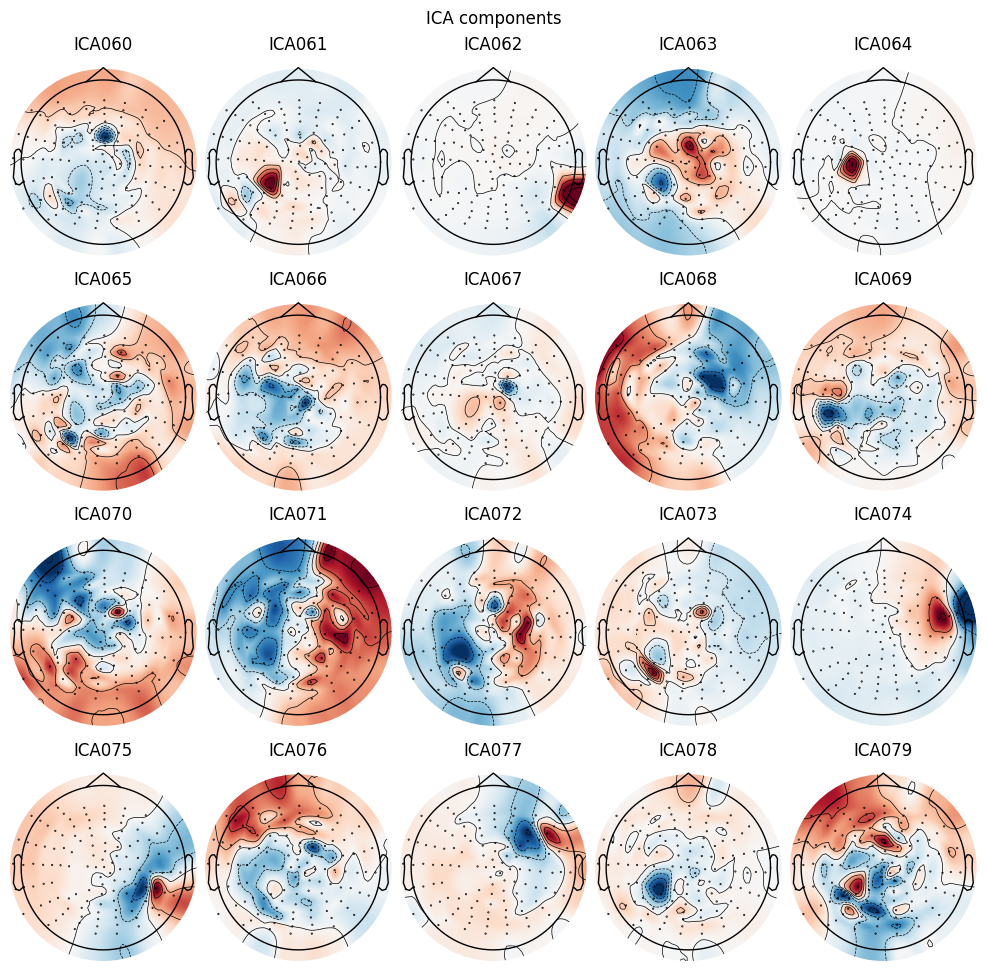

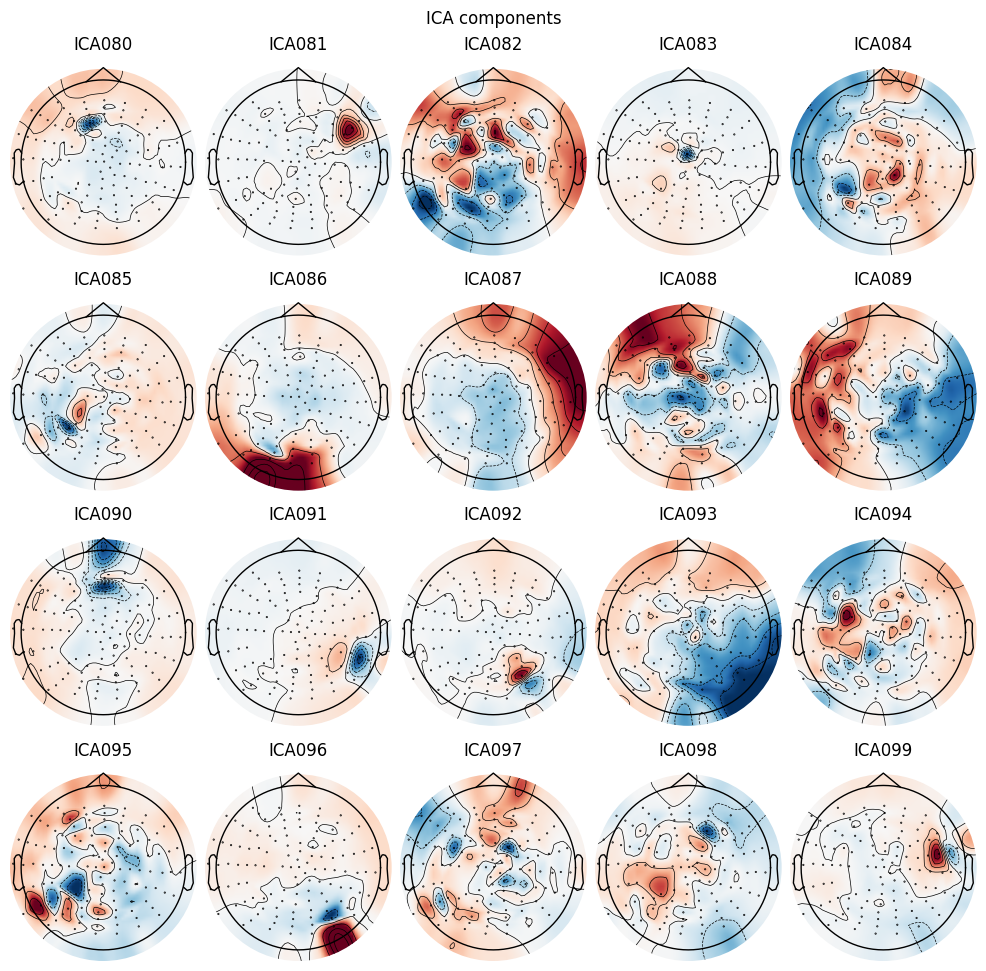

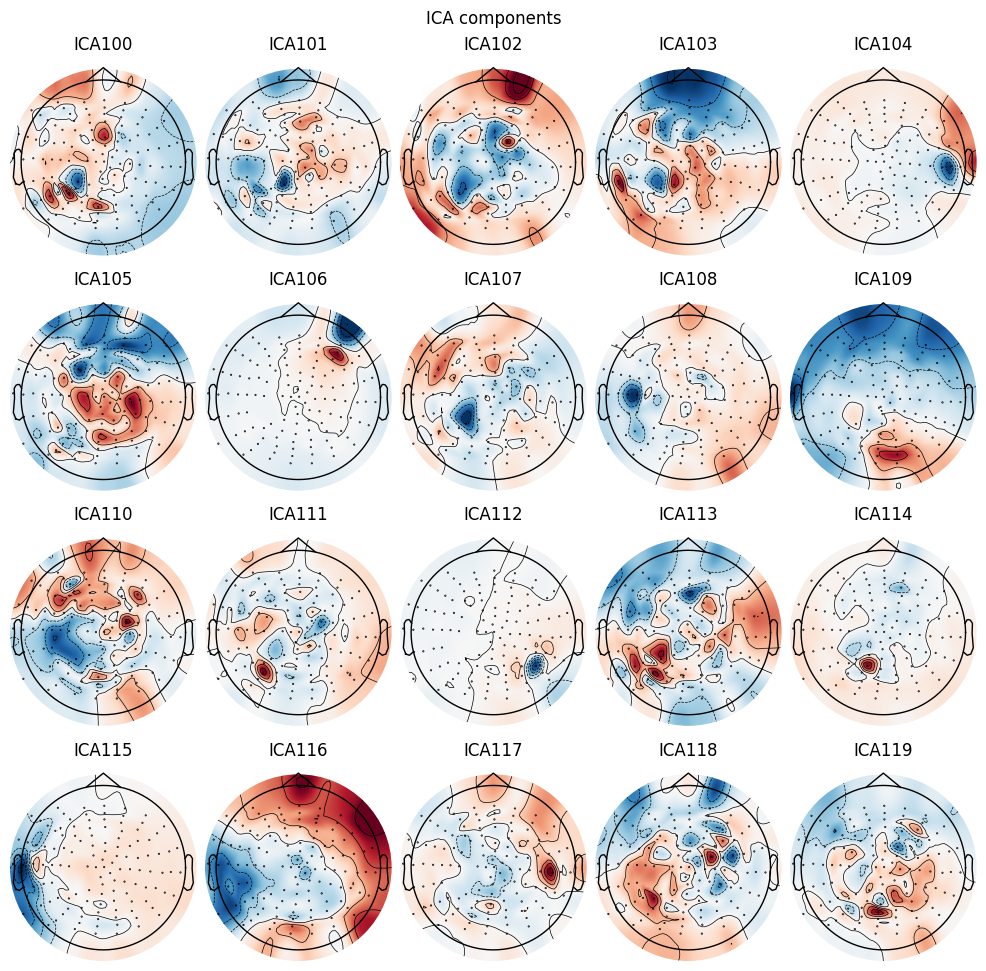

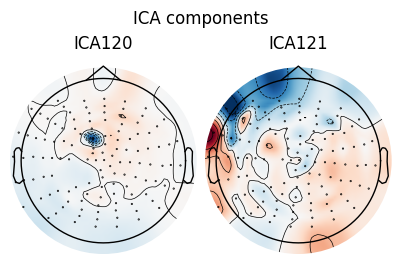

Applying ICA to Raw instance
    Transforming to ICA space (122 components)
    Zeroing out 1 ICA component
    Projecting back using 122 PCA components


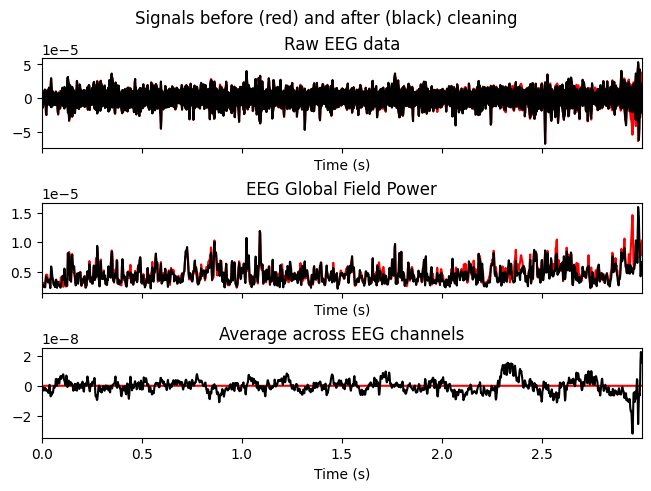

In [21]:
ica.plot_components();
# blinks
ica.plot_overlay(raw_seg, exclude=[0], picks="eeg");

### IClabel
Automatically labelling components using IClabel

In [22]:
ic_labels = label_components(epochs_ar, ica, method="iclabel")

labels = ic_labels["labels"]
probs = ic_labels["y_pred_proba"]

for i, label in enumerate(labels):
    print(f"IC {i}: {label}")

C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\1822960639.py:1: RuntimeWarning: The provided Epochs instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(epochs_ar, ica, method="iclabel")
C:\Users\Vaishali\AppData\Local\Temp\ipykernel_20776\1822960639.py:1: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  ic_labels = label_components(epochs_ar, ica, method="iclabel")


IC 0: brain
IC 1: muscle artifact
IC 2: eye blink
IC 3: brain
IC 4: muscle artifact
IC 5: brain
IC 6: other
IC 7: brain
IC 8: brain
IC 9: brain
IC 10: brain
IC 11: brain
IC 12: muscle artifact
IC 13: brain
IC 14: brain
IC 15: eye blink
IC 16: muscle artifact
IC 17: muscle artifact
IC 18: other
IC 19: muscle artifact
IC 20: brain
IC 21: muscle artifact
IC 22: eye blink
IC 23: muscle artifact
IC 24: brain
IC 25: other
IC 26: muscle artifact
IC 27: muscle artifact
IC 28: eye blink
IC 29: muscle artifact
IC 30: muscle artifact
IC 31: brain
IC 32: eye blink
IC 33: heart beat
IC 34: other
IC 35: brain
IC 36: other
IC 37: brain
IC 38: brain
IC 39: heart beat
IC 40: other
IC 41: other
IC 42: muscle artifact
IC 43: other
IC 44: muscle artifact
IC 45: other
IC 46: muscle artifact
IC 47: other
IC 48: brain
IC 49: channel noise
IC 50: brain
IC 51: brain
IC 52: muscle artifact
IC 53: brain
IC 54: muscle artifact
IC 55: line noise
IC 56: other
IC 57: heart beat
IC 58: other
IC 59: other
IC 60: other

### Select Brain components
Automatically select brain components and exclude eye blinks and muscle artifacts

In [23]:
exclude_idx = [
    idx for idx, label in enumerate(labels)
    if label not in ["brain", "other"]
]

print("Excluding components:", exclude_idx)

ica.exclude = exclude_idx

Excluding components: [1, 2, 4, 12, 15, 16, 17, 19, 21, 22, 23, 26, 27, 28, 29, 30, 32, 33, 39, 42, 44, 46, 49, 52, 54, 55, 57, 62, 64, 68, 69, 74, 77, 79, 81, 83, 87, 91, 92, 95, 104, 106, 112, 114, 115, 116, 117]


### Apply ICA to epochs

In [24]:
epochs_ica = epochs_ar.copy()

ica.apply(epochs_ica)

print("Remaining epochs:", len(epochs_ica))

Applying ICA to Epochs instance
    Transforming to ICA space (122 components)
    Zeroing out 47 ICA components
    Projecting back using 122 PCA components
Remaining epochs: 260


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1618 matching events found
No baseline correction applied
0 projection items activated


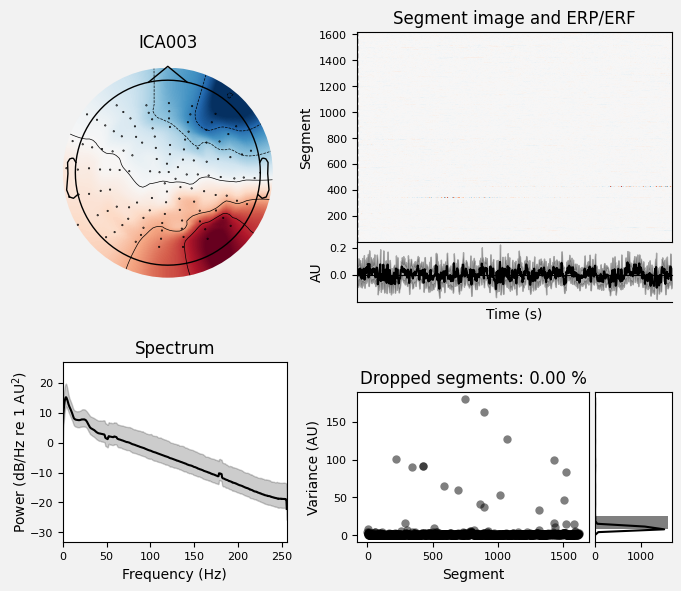

[<Figure size 700x600 with 6 Axes>]

In [25]:
ica.plot_properties(raw, picks=[3])

### Plotting excluded components (just in case)

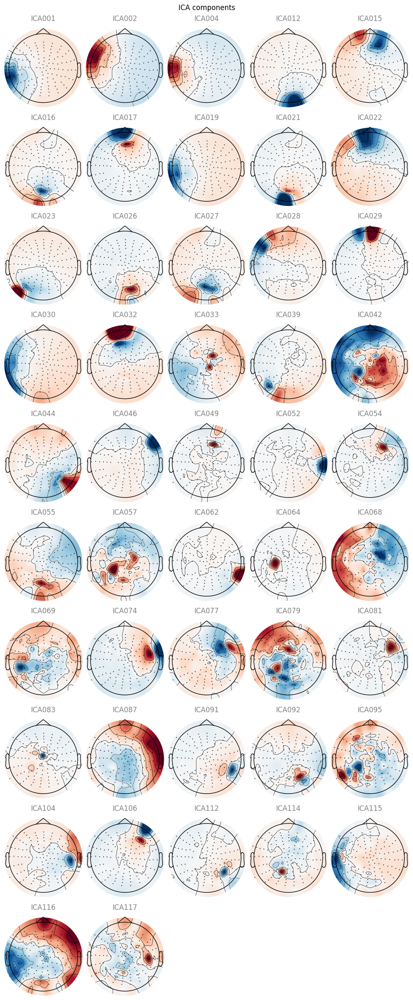

In [26]:
ica.plot_components(exclude_idx)
ica.exclude = exclude_idx

Applying ICA to Evoked instance
    Transforming to ICA space (122 components)
    Zeroing out 47 ICA components
    Projecting back using 122 PCA components


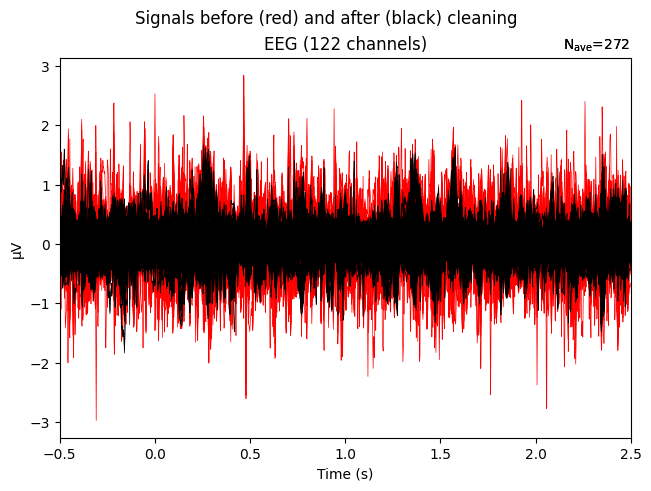

Applying ICA to Epochs instance
    Transforming to ICA space (122 components)
    Zeroing out 47 ICA components
    Projecting back using 122 PCA components


<Epochs | 272 events (all good), -0.5 – 2.5 s (baseline off), ~389.3 MiB, data loaded,
 'RHS': 272>

In [27]:
ica.plot_overlay(epochs.average(), exclude=ica.exclude)
ica.apply(epochs, exclude=ica.exclude)

In [28]:
ar2 = AutoReject(
    n_interpolate=[1, 2, 3, 4],
    random_state=11,
    n_jobs=1,
    verbose=True
)

ar2.fit(epochs)
epochs_ica, reject_log2 = ar2.transform(epochs, return_log=True)

print("Final number of epochs:", len(epochs_ica))

Running autoreject on ch_type=eeg


100%|██████████| Creating augmented epochs : 122/122 [00:17<00:00,    7.06it/s]
100%|██████████| Computing thresholds ... : 122/122 [05:01<00:00,    2.47s/it]

















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:09<00:00,    3.93it/s]

















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:13<00:00,    3.71it/s]






















100%|██████████| Fold : 10/10 [01:13<00:00,    7.33s/it]
















































































Estimated consensus=0.30 and n_interpolate=4



















































































































































































































































































100%|██████████| Repairing epochs : 272/272 [01:12<00:00,    3.73it/s]

Dropped 11 epochs: 0, 7, 8, 9, 51, 52, 141, 142, 219, 224, 225
Final number of epochs: 261


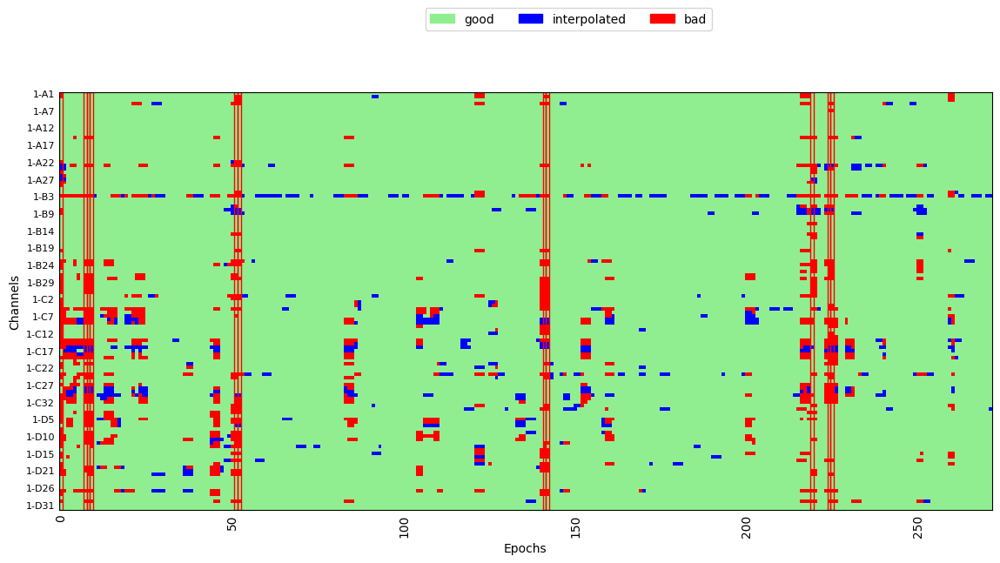

In [29]:
reject_log2.plot('horizontal');

## TFR beta band

In [30]:
freqs = np.arange(12, 31, 1)  # Beta band
n_cycles = freqs / 2       

power = mne.time_frequency.tfr_morlet(
    epochs_ica,
    freqs=freqs,
    n_cycles=n_cycles,
    return_itc=False,
    average=False, 
    decim=1,
    n_jobs=1
)

print("TFR shape:", power.data.shape)
# shape = (n_epochs, n_channels, n_freqs, n_times)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


MemoryError: Unable to allocate 58.2 MiB for an array with shape (261, 19, 1537) and data type float64

In [ ]:
# Average across beta frequencies
beta_power = power.data.mean(axis=2)
# shape: (n_epochs, n_channels, n_times)

print("Beta power shape:", beta_power.shape)

Beta power shape: (260, 122, 1537)


## Compute mean beta power across channels
For the sensorimotor region only

In [ ]:
threshold = np.percentile(beta_power, 75)
print("Beta burst threshold:", threshold)

beta_binary = beta_power > threshold

Beta burst threshold: 1.6873686954162763e-10


In [ ]:
sfreq = epochs_ica.info['sfreq']
min_samples = int(0.1 * sfreq)  # 100 ms minimum

burst_durations = []
burst_amplitudes = []

n_epochs, n_channels, n_times = beta_binary.shape

for ep in range(n_epochs):
    for ch in range(n_channels):
        signal = beta_binary[ep, ch]
        amplitude = beta_power[ep, ch]

        burst_start = None

        for t in range(n_times):
            if signal[t] and burst_start is None:
                burst_start = t

            elif not signal[t] and burst_start is not None:
                duration = t - burst_start

                if duration >= min_samples:
                    burst_durations.append(duration / sfreq)
                    burst_amplitudes.append(
                        amplitude[burst_start:t].max()
                    )

                burst_start = None

In [ ]:
burst_rate = len(burst_durations) / (
    n_epochs * (n_times / sfreq)
)

print("Total bursts:", len(burst_durations))
print("Average burst duration (s):", np.mean(burst_durations))
print("Average burst amplitude:", np.mean(burst_amplitudes))
print("Burst rate (bursts/s):", burst_rate)

Total bursts: 79258
Average burst duration (s): 0.26748628194472485
Average burst amplitude: 3.5472265854041686e-10
Burst rate (bursts/s): 101.54670937390522


No baseline correction applied


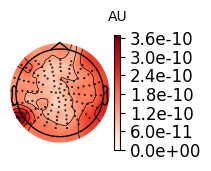

In [ ]:
power_avg = power.average()
power_avg.plot_topomap(fmin=13, fmax=30);

In [ ]:
print(epochs_ica.ch_names)

['1-A1', '1-A2', '1-A3', '1-A5', '1-A6', '1-A7', '1-A8', '1-A9', '1-A10', '1-A11', '1-A12', '1-A13', '1-A14', '1-A15', '1-A16', '1-A17', '1-A18', '1-A19', '1-A20', '1-A21', '1-A22', '1-A23', '1-A24', '1-A25', '1-A26', '1-A27', '1-A28', '1-A29', '1-A30', '1-B1', '1-B3', '1-B4', '1-B5', '1-B6', '1-B7', '1-B9', '1-B10', '1-B11', '1-B12', '1-B13', '1-B14', '1-B15', '1-B16', '1-B17', '1-B18', '1-B19', '1-B20', '1-B21', '1-B22', '1-B23', '1-B24', '1-B25', '1-B26', '1-B27', '1-B28', '1-B29', '1-B30', '1-B31', '1-B32', '1-C1', '1-C2', '1-C3', '1-C4', '1-C5', '1-C6', '1-C7', '1-C8', '1-C9', '1-C10', '1-C11', '1-C12', '1-C13', '1-C14', '1-C15', '1-C16', '1-C17', '1-C18', '1-C19', '1-C20', '1-C21', '1-C22', '1-C23', '1-C24', '1-C25', '1-C26', '1-C27', '1-C28', '1-C29', '1-C30', '1-C31', '1-C32', '1-D1', '1-D2', '1-D3', '1-D4', '1-D5', '1-D6', '1-D7', '1-D8', '1-D9', '1-D10', '1-D11', '1-D12', '1-D13', '1-D14', '1-D15', '1-D16', '1-D17', '1-D18', '1-D20', '1-D21', '1-D22', '1-D23', '1-D24', '1-D25

In [ ]:
motor_channels = ['1-C1', '1-C2', '1-C3', '1-C4', '1-C5', '1-C6', '1-C7', '1-C8', '1-C9', '1-C10', '1-C11', '1-C12', '1-C13', '1-C14', '1-C15', '1-C16', '1-C17', '1-C18', '1-C19', '1-C20', '1-C21', '1-C22', '1-C23', '1-C24', '1-C25', '1-C26', '1-C27', '1-C28', '1-C29', '1-C30', '1-C31', '1-C32']

picks = mne.pick_channels(epochs_ica.ch_names, include=motor_channels)

beta_motor = beta_power[:, picks, :]
beta_motor = beta_motor.mean(axis=1)  # average across motor channels

print(beta_motor.shape)
# (n_epochs, n_times)

(260, 1537)


In [ ]:
n_times = beta_motor.shape[1]
gait_percent = np.linspace(0, 100, n_times)

In [ ]:
beta_avg = beta_motor.mean(axis=0)

In [ ]:
stance_idx = gait_percent <= 60
swing_idx  = gait_percent > 60

beta_stance = beta_avg[stance_idx]
beta_swing  = beta_avg[swing_idx]

print("Mean beta (stance):", beta_stance.mean())
print("Mean beta (swing):", beta_swing.mean())

Mean beta (stance): 1.6858163582654153e-10
Mean beta (swing): 1.6775375299491034e-10


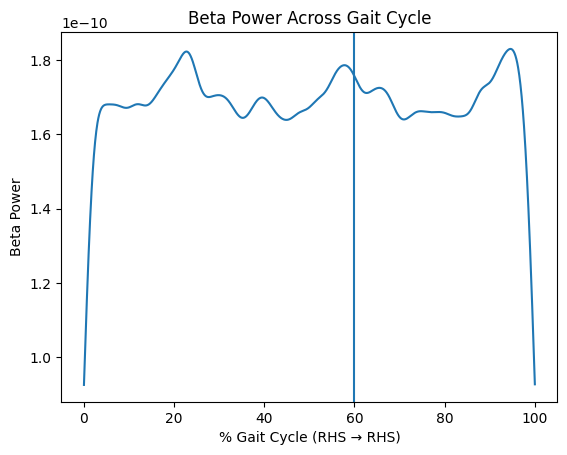

In [ ]:
plt.figure()
plt.plot(gait_percent, beta_avg)
plt.axvline(60)
plt.xlabel("% Gait Cycle (RHS → RHS)")
plt.ylabel("Beta Power")
plt.title("Beta Power Across Gait Cycle")
plt.show()

## ERSP Computation

In [ ]:
epochs

<Epochs | 272 events (all good), -0.5 – 2.5 s (baseline off), ~389.3 MiB, data loaded,
 'RHS': 272>

In [ ]:
freqs = np.arange(4, 45, 1)     # 4–45 Hz (theta - low gamma)
n_cycles = freqs / 2            

power = mne.time_frequency.tfr_morlet(
    epochs,
    freqs=freqs,
    n_cycles=n_cycles,
    return_itc=False,
    average=False
)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


MemoryError: Unable to allocate 15.6 GiB for an array with shape (122, 272, 41, 1537) and data type float64

In [ ]:
n_times = power.data.shape[-1]
gait_percent = np.linspace(0, 100, n_times)

baseline_idx = gait_percent <= 10  # first 10%

In [ ]:
power_data = power.data 
baseline = power_data[:, :, :, baseline_idx].mean(axis=-1, keepdims=True)

ersp = 10 * np.log10(power_data / baseline)

MemoryError: Unable to allocate 6.90 GiB for an array with shape (260, 122, 19, 1537) and data type float64

In [ ]:
ersp_avg = ersp.mean(axis=0)  # average trials

NameError: name 'ersp' is not defined

In [ ]:
picks = mne.pick_channels(epochs.ch_names, include=motor_channels)

ersp_motor = ersp_avg[picks].mean(axis=0)

In [ ]:
plt.figure()
plt.imshow(
    ersp_motor,
    aspect='auto',
    origin='lower',
    extent=[0, 100, freqs[0], freqs[-1]]
)
plt.axvline(60)
plt.colorbar(label='ERSP (dB)')
plt.xlabel('% Gait Cycle')
plt.ylabel('Frequency (Hz)')
plt.title('ERSP over Gait Cycle (Motor Cortex)')
plt.show()